In [1]:
# https://docs.nvidia.com/deeplearning/dali/user-guide/docs/examples/getting_started.html

In [2]:
import os
from os.path import join, isdir, isfile
from nvidia.dali.pipeline import Pipeline
from nvidia.dali import pipeline_def
import nvidia.dali.fn as fn
import nvidia.dali.types as types

In [3]:
DATASET_PATH = "../../Datasets/mini_imagenet"
isdir(DATASET_PATH)

True

In [4]:
image_dir = DATASET_PATH
max_batch_size=8

@pipeline_def
def simple_pipeline():
    jpegs, labels = fn.readers.file(file_root=image_dir)
    images = fn.decoders.image(jpegs, device="cpu")
    return images, labels

In [5]:
pipe = simple_pipeline(batch_size=max_batch_size, num_threads=1, device_id=0)
pipe.build()

In [6]:
print(pipe)

In [7]:
pipe_out = pipe.run()
print(pipe_out)

(TensorListCPU(
    [[[[184 162 138]
      [184 162 138]
      ...
      [165 134 114]
      [165 134 114]]

     [[183 163 138]
      [185 163 139]
      ...
      [165 134 113]
      [165 134 113]]

     ...

     [[128 160 111]
      [129 161 112]
      ...
      [ 90 129  74]
      [ 90 129  74]]

     [[129 161 112]
      [129 161 112]
      ...
      [ 91 128  74]
      [ 91 128  74]]]


    [[[168 148 123]
      [154 134 109]
      ...
      [160 168 117]
      [163 170 126]]

     [[159 137 113]
      [149 128 101]
      ...
      [156 163 109]
      [156 164 115]]

     ...

     [[129 126 117]
      [112 109 100]
      ...
      [112 117  63]
      [122 126  75]]

     [[134 134 126]
      [121 121 113]
      ...
      [124 128  78]
      [131 134  87]]]


    ...


    [[[248 178 119]
      [246 176 117]
      ...
      [182 174 163]
      [127 127 115]]

     [[244 178 120]
      [241 176 118]
      ...
      [247 239 228]
      [135 123 109]]

     ...

     [[ 97 102  22]

In [8]:
images, labels = pipe_out
print("Images is_dense_tensor: " + str(images.is_dense_tensor()))
print("Labels is_dense_tensor: " + str(labels.is_dense_tensor()))

Images is_dense_tensor: False
Labels is_dense_tensor: True


In [9]:
print(labels)

TensorListCPU(
    [[0]
     [0]
     [0]
     [0]
     [0]
     [0]
     [0]
     [0]],
    dtype=DALIDataType.INT32,
    num_samples=8,
    shape=[(1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,)])


In [10]:
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt

%matplotlib inline

def show_images(image_batch):
    columns = 4
    rows = (max_batch_size + 1) // (columns)
    fig = plt.figure(figsize=(24, (24 // columns) * rows))
    gs = gridspec.GridSpec(rows, columns)
    for j in range(rows * columns):
        plt.subplot(gs[j])
        plt.axis("off")
        plt.imshow(image_batch.at(j))

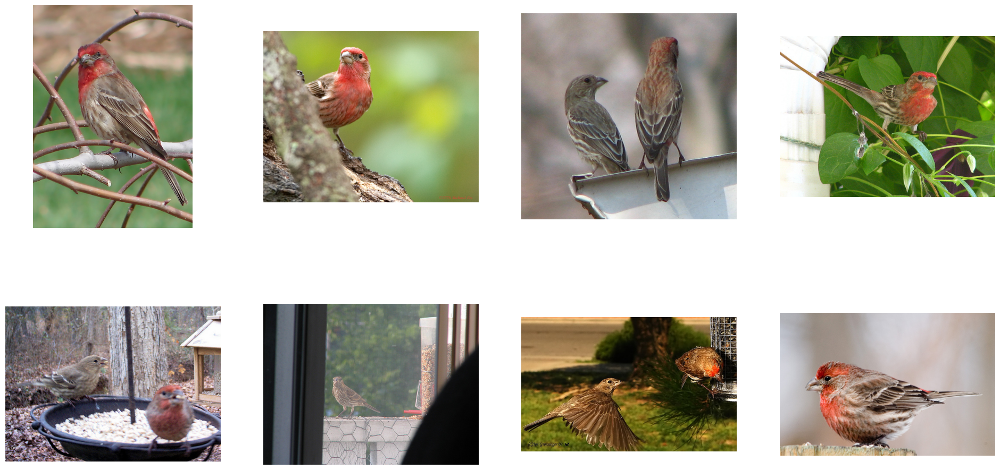

In [11]:
show_images(images)



In [12]:
# add augmentations
@pipeline_def
def shuffled_pipeline():
    jpegs, labels = fn.readers.file(
        file_root=image_dir, random_shuffle=True, initial_fill=32
    )
    images = fn.decoders.image(jpegs, device="cpu")
    return images, labels

In [14]:
pipe = shuffled_pipeline(batch_size=max_batch_size, num_threads=1, device_id=0, seed=1234)
pipe.build()

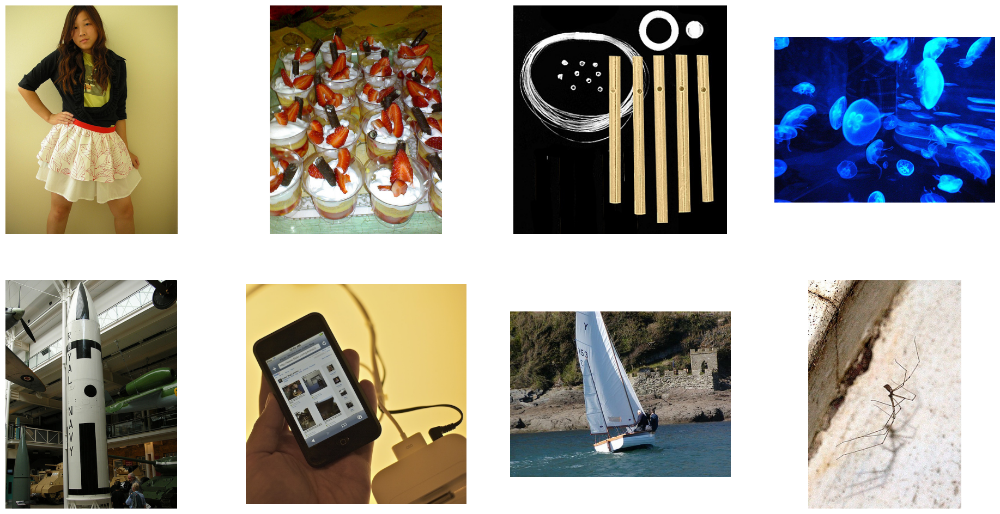

In [15]:
pipe_out = pipe.run()
images, labels = pipe_out
show_images(images)

In [16]:
@pipeline_def
def rotated_pipeline():
    jpegs, labels = fn.readers.file(
        file_root=image_dir, random_shuffle=True, initial_fill=21
    )
    images = fn.decoders.image(jpegs, device="cpu")
    rotated_images = fn.rotate(images, angle=10.0, fill_value=0)

    return rotated_images, labels

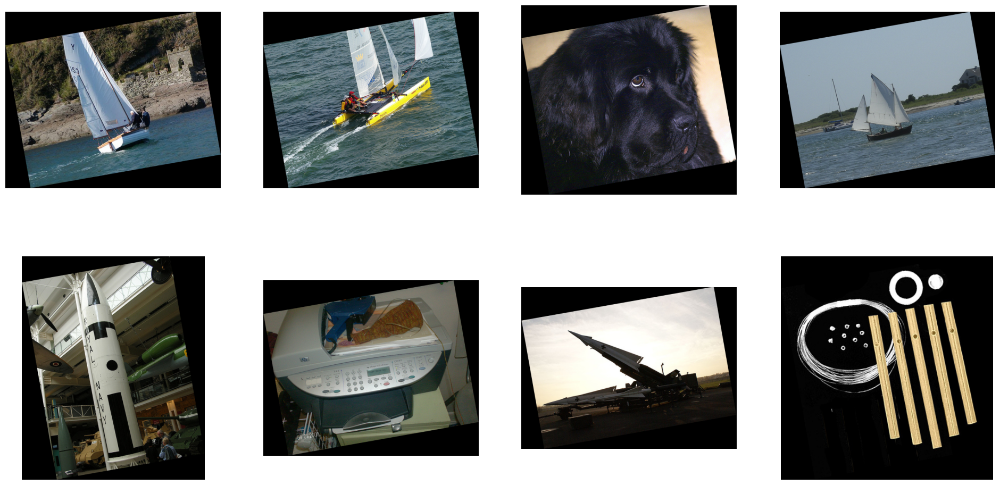

In [17]:
pipe = rotated_pipeline(
    batch_size=max_batch_size, num_threads=1, device_id=0, seed=1234
)
pipe.build()

pipe_out = pipe.run()
images, labels = pipe_out
show_images(images)

In [18]:
@pipeline_def
def random_rotated_pipeline():
    jpegs, labels = fn.readers.file(
        file_root=image_dir, random_shuffle=True, initial_fill=21
    )
    images = fn.decoders.image(jpegs, device="cpu")
    angle = fn.random.uniform(range=(-10.0, 10.0))
    rotated_images = fn.rotate(images, angle=angle, fill_value=0)

    return rotated_images, labels



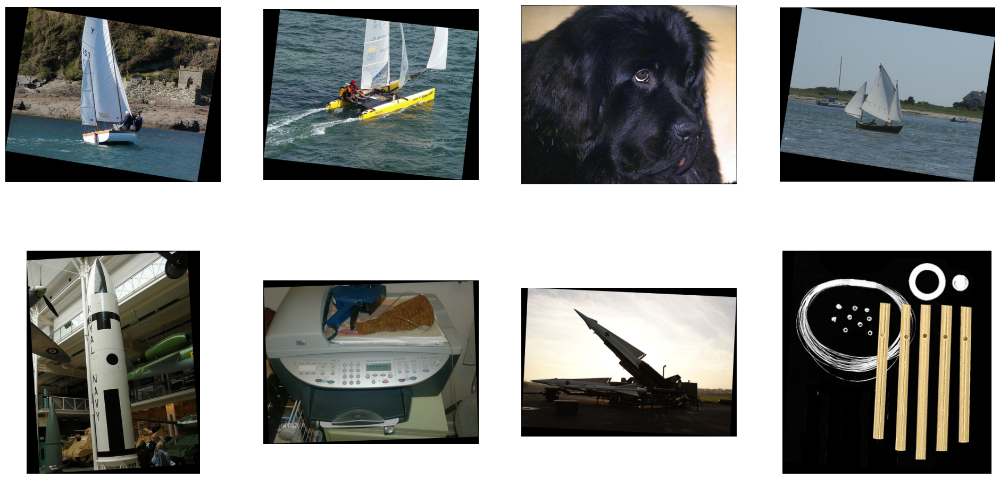

In [19]:
pipe = random_rotated_pipeline(
    batch_size=max_batch_size, num_threads=1, device_id=0, seed=1234
)
pipe.build()
pipe_out = pipe.run()
images, labels = pipe_out
show_images(images)

In [20]:
# Use GPU
@pipeline_def 
def random_rotated_gpu_pipeline():
    jpegs, labels = fn.readers.file(
        file_root=image_dir, random_shuffle=True, initial_fill=21
    )
    images = fn.decoders.image(jpegs, device="cpu")
    angle = fn.random.uniform(range=(-10.0, 10.0))
    rotated_images = fn.rotate(images.gpu(), angle=angle, fill_value=0)
    return rotated_images, labels

In [21]:
pipe = random_rotated_gpu_pipeline(
    batch_size=max_batch_size, num_threads=1, device_id=0, seed=1234
)
pipe.build()

pipe_out = pipe.run()
print(pipe_out)


(TensorListGPU(
    [[[[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     ...

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]]


    [[[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     ...

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]]


    ...


    [[[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     ...

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]]


    [[[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
      [0 0 0]]

     [[0 0 0]
      [0 0 0]
      ...
      [0 0 0]
 

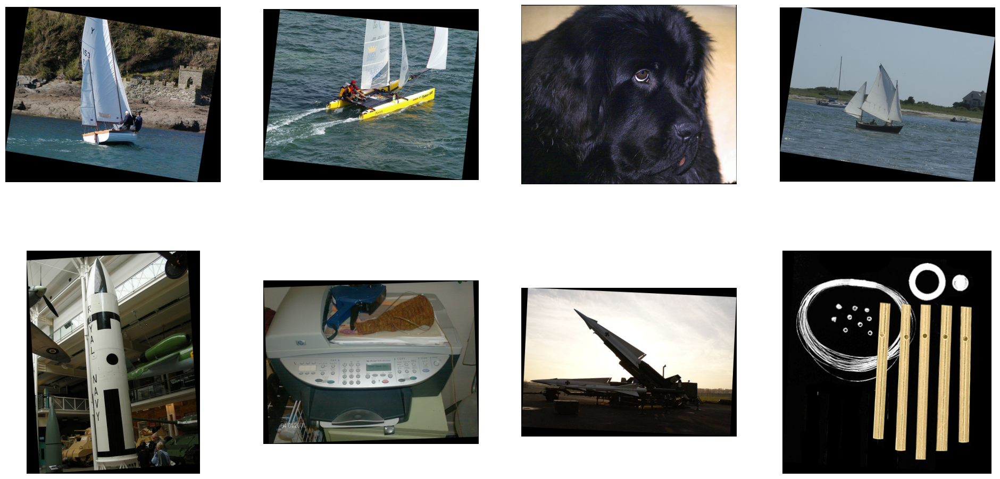

In [22]:
images, labels = pipe_out
show_images(images.as_cpu())

In [23]:
@pipeline_def
def hybrid_pipeline():
    jpegs, labels = fn.readers.file(
        file_root=image_dir, random_shuffle=True, initial_fill=21
    )
    images = fn.decoders.image(jpegs, device="mixed")

    return images, labels



In [24]:
pipe = hybrid_pipeline(
    batch_size=max_batch_size, num_threads=1, device_id=0, seed=1234
)
pipe.build()

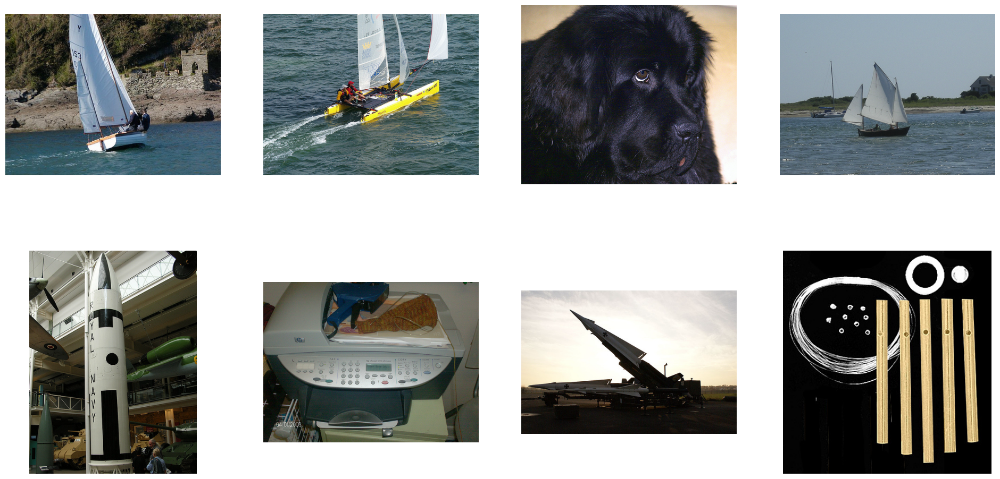

In [25]:
pipe_out = pipe.run()
images, labels = pipe_out
show_images(images.as_cpu())

In [26]:
from timeit import default_timer as timer

test_batch_size = 64


def speedtest(pipeline, batch, n_threads):
    pipe = pipeline(batch_size=batch, num_threads=n_threads, device_id=0)
    pipe.build()
    # warmup
    for i in range(5):
        pipe.run()
    # test
    n_test = 20
    t_start = timer()
    for i in range(n_test):
        pipe.run()
    t = timer() - t_start
    print("Speed: {} imgs/s".format((n_test * batch) / t))



In [27]:
speedtest(shuffled_pipeline, test_batch_size, 4)

Speed: 2127.2705449161676 imgs/s


In [28]:
speedtest(hybrid_pipeline, test_batch_size, 4)

Speed: 3644.4883709162877 imgs/s
